In [1]:
%load_ext autoreload
%autoreload 2

from functools import reduce
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from pymongo import MongoClient
from smartenergy.database import MinuteMeasurements, HourlyMeasurements
from smartenergy.ml_service.features import BatteryStateFeatures, BasicPreprocessor, DateFeatures, DataGrouper, Pipeline

from IPython.core.display import display, HTML
from jupyterthemes import jtplot
jtplot.style('onedork')

np.warnings.filterwarnings('ignore')
pd.options.display.float_format = '{:.2f}'.format
display(HTML("<style>.container { width: 1600px !important; }</style>"))

DEBUG:2018-10-01 10:39:46,847:matplotlib.backends:::backend module://ipykernel.pylab.backend_inline version unknown


In [2]:
hourly_measurements = HourlyMeasurements()
stations = hourly_measurements.station_ids
data = hourly_measurements.load().set_index(['solbox_id', 'datetime'])
print(data.shape)
data.sample(5)

(58586, 18)


,,battery_state_continuous_at_change,battery_state_continuous_computed,battery_state_continuous_theoretical,battery_state_discrete,battery_state_percent,day,energy_consumption_computed_i,energy_consumption_i,energy_excess_i,energy_generation_computed_i,energy_generation_i,energy_to_battery_i,energy_to_battery_untracked_i,energy_to_grid_i,hour,month,temperature,year
solbox_id,datetime,,,,,,,,,,,,,,,,,,
47,2018-01-20 21:00:00,nan,7449.68,80115.28,3.00,75.00,20.00,12676.43,12675.43,0.00,133.58,133.58,-12585.57,-519.04,270.36,21.00,1.00,648.13,2018.00
32,2018-01-03 17:00:00,nan,71221.53,9262.65,3.00,75.00,3.00,6566.31,6566.31,0.00,386.40,385.40,-7013.80,938.77,69.79,17.00,1.00,586.82,2018.00
71,2018-05-01 14:00:00,nan,298336.28,-148580.76,3.00,75.00,1.00,1849.44,1849.44,0.00,134006.80,134005.80,-49050.99,31922.65,-658.41,14.00,5.00,1225.30,2018.00
40,2018-02-04 10:00:00,nan,-1657157.44,-1194631.82,3.00,75.00,4.00,791.59,790.59,0.00,39837.87,39837.87,31711.70,-743.61,452.94,10.00,2.00,890.59,2018.00
71,2017-12-25 18:00:00,nan,517.91,-1719.53,3.00,75.00,25.00,476.38,476.38,0.00,667.07,666.07,-1247.17,745.81,-244.93,18.00,12.00,795.47,2017.00


In [3]:
data.columns

Index(['battery_state_continuous_at_change',
       'battery_state_continuous_computed',
       'battery_state_continuous_theoretical', 'battery_state_discrete',
       'battery_state_percent', 'day', 'energy_consumption_computed_i',
       'energy_consumption_i', 'energy_excess_i',
       'energy_generation_computed_i', 'energy_generation_i',
       'energy_to_battery_i', 'energy_to_battery_untracked_i',
       'energy_to_grid_i', 'hour', 'month', 'temperature', 'year'],
      dtype='object')

### Analyze time patterns on different variables

In [4]:
data['energy_generation_theoretical_i'] = data['energy_consumption_i'] + data['energy_to_battery_i'] + data['energy_to_grid_i']
data['energy_generation_computed_theoretical_i'] = data['energy_consumption_computed_i'] + data['energy_to_battery_i'] + data['energy_to_grid_i']
data['generation_difference'] = data['energy_generation_theoretical_i'] - data['energy_generation_i'] 
data['generation_computed_difference'] = data['energy_generation_computed_theoretical_i'] - data['energy_generation_i'] 
data[['generation_difference', 'generation_computed_difference']].sum()

generation_difference            -316706051.89
generation_computed_difference   -316677873.89
dtype: float64

In [5]:
variables = ['energy_consumption_computed_i', 'energy_consumption_i', 'energy_excess_i',
             'energy_generation_computed_i', 'energy_generation_i', 'energy_to_battery_i',
             'energy_to_battery_untracked_i', 'energy_to_grid_i', 'energy_generation_theoretical_i',
             'energy_generation_computed_theoretical_i', 'generation_difference', 'generation_computed_difference']

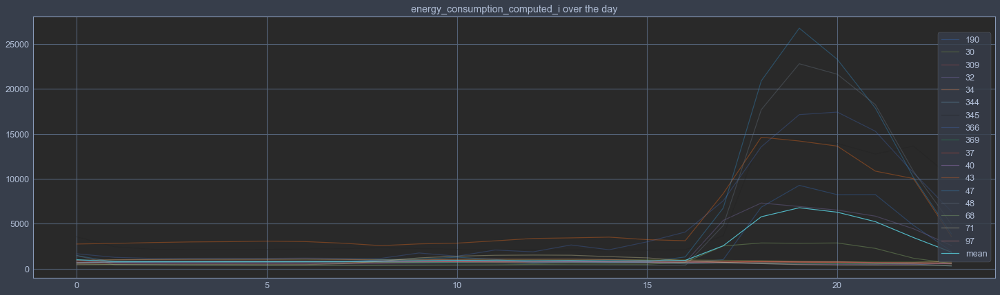

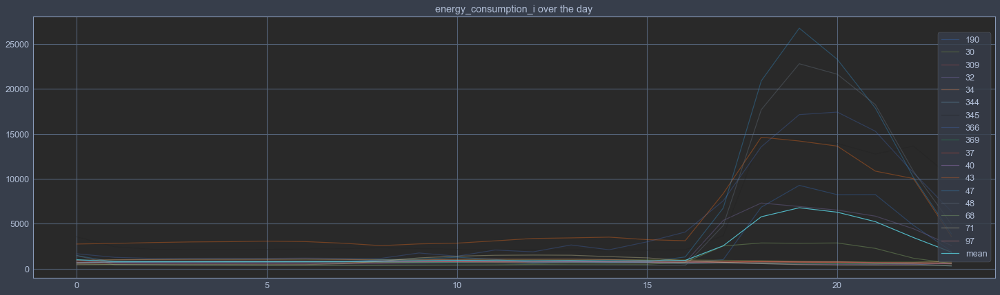

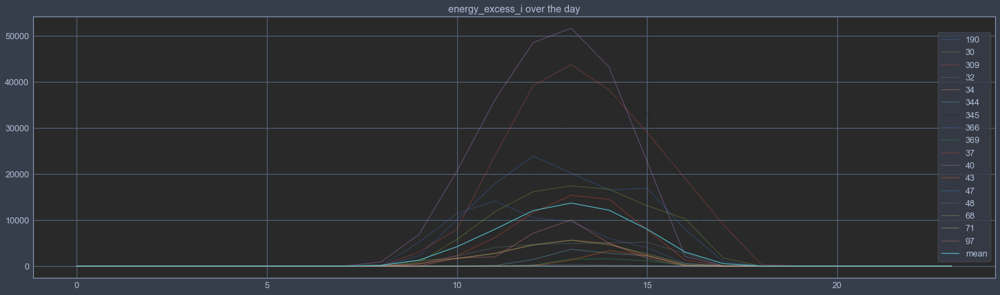

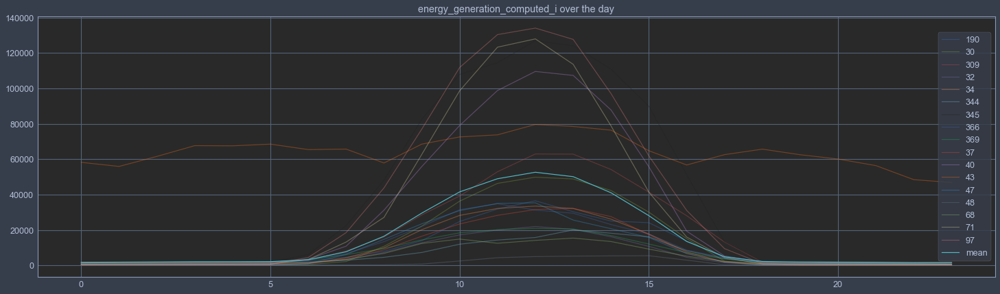

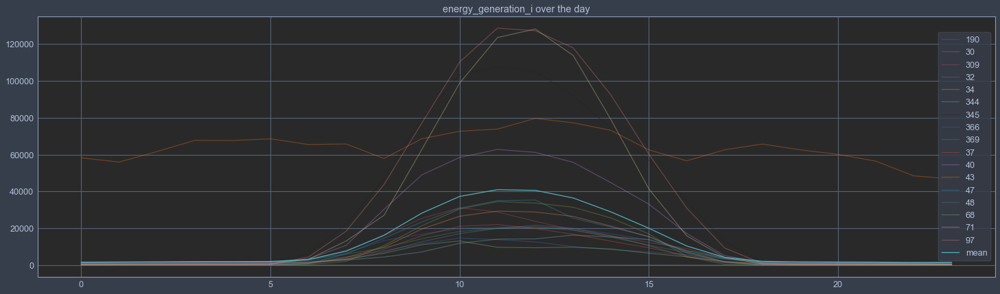

...

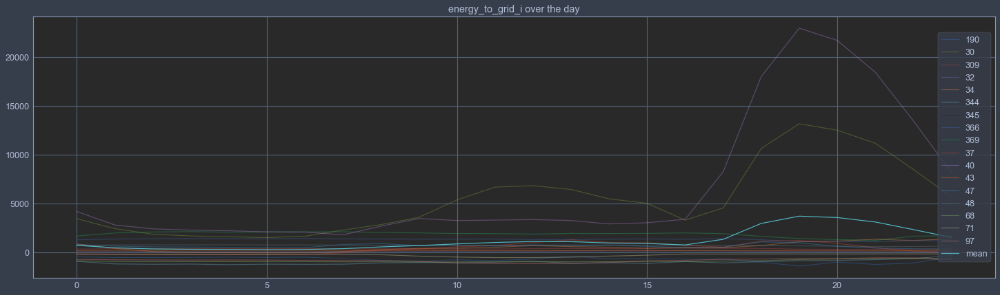

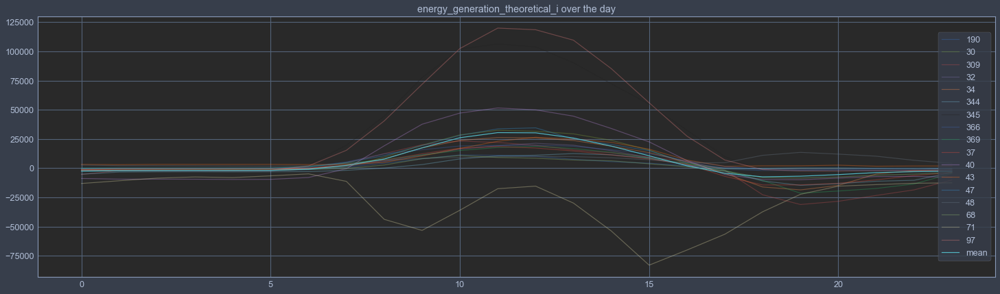

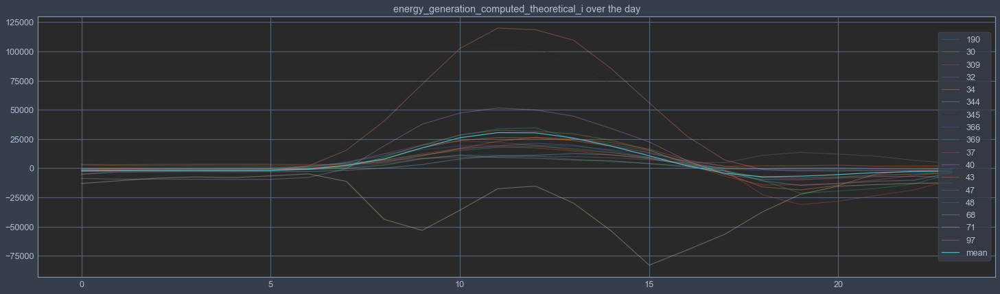

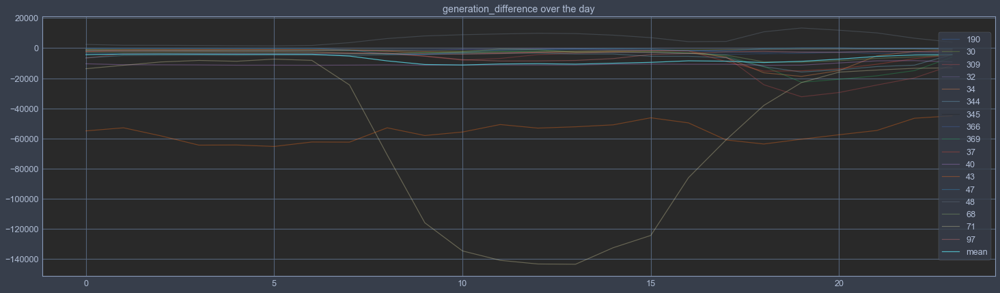

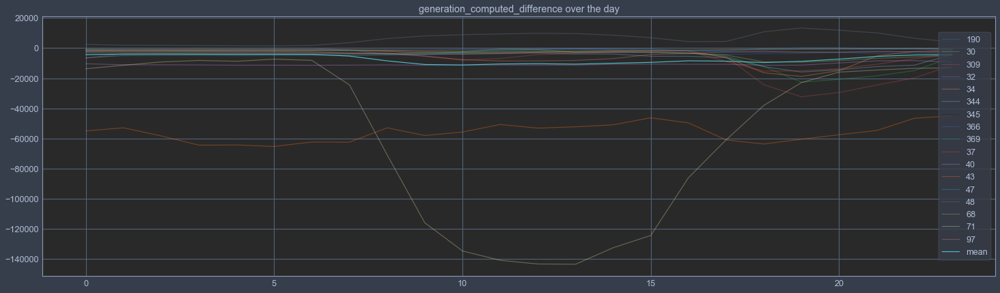

In [33]:
# Visualize currents over the day
for var in variables:
    fig, ax = plt.subplots(1, 1, figsize=(25, 7))
    for station in stations:
        plt.plot(data.loc[station].groupby('hour')[var].mean(), label=station, alpha=0.35)
        
    plt.plot(data.groupby('hour')[var].mean(), label='mean')
    plt.title('{} over the day'.format(var))
    plt.legend(loc='right')
    ax.set_facecolor('#292929')
    plt.show()

In [62]:
data['weekday'] = [d.weekday() for d in data.index.get_level_values(1)]

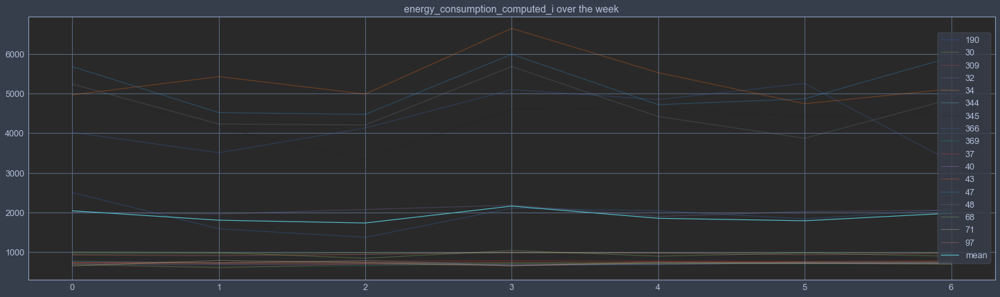

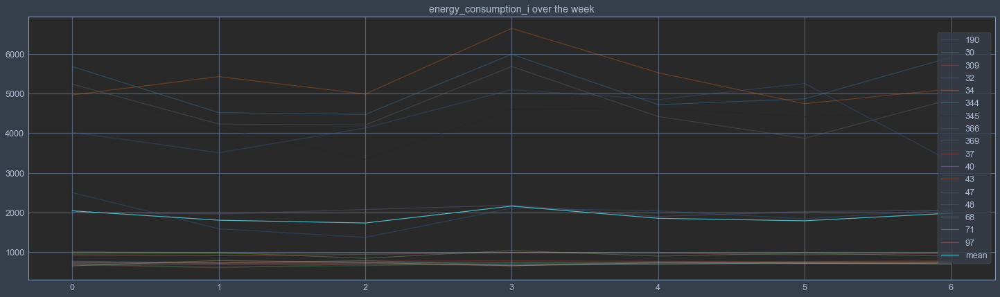

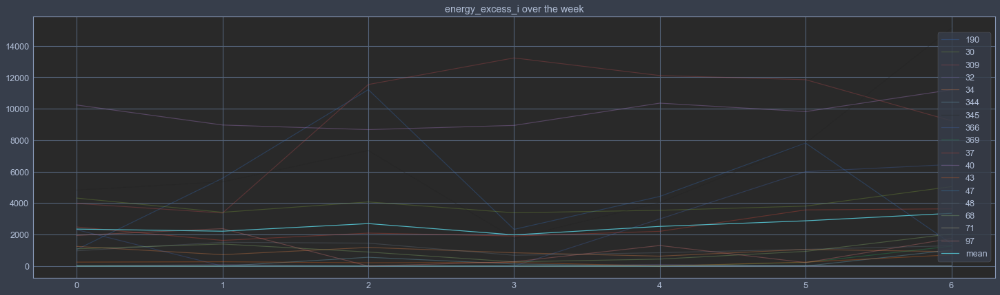

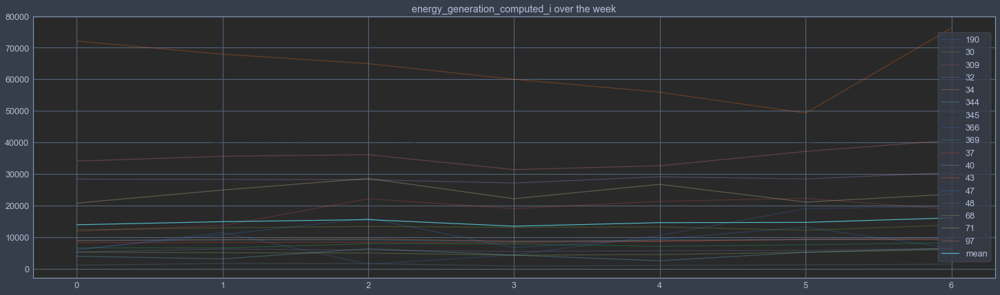

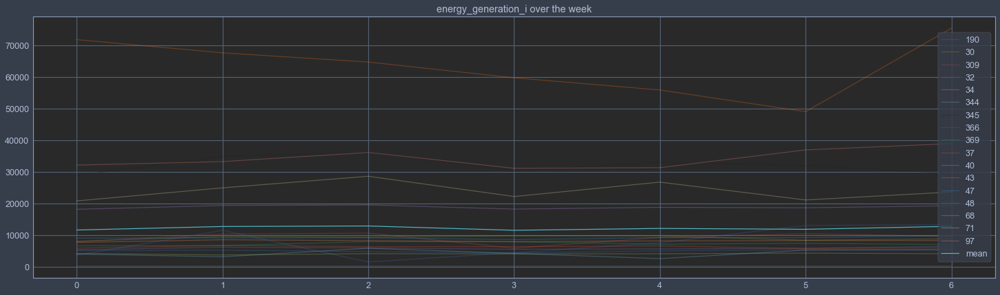

...

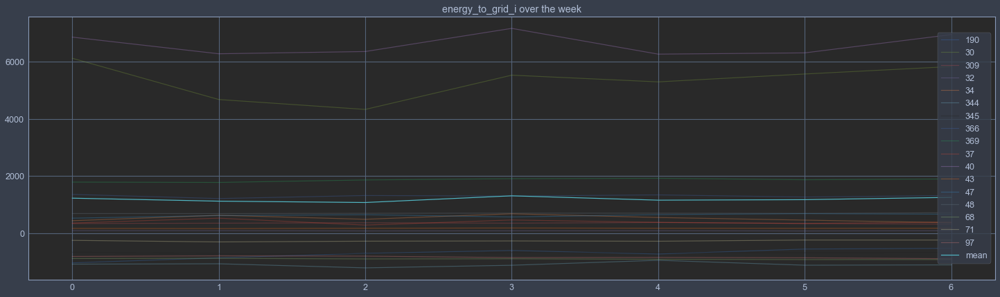

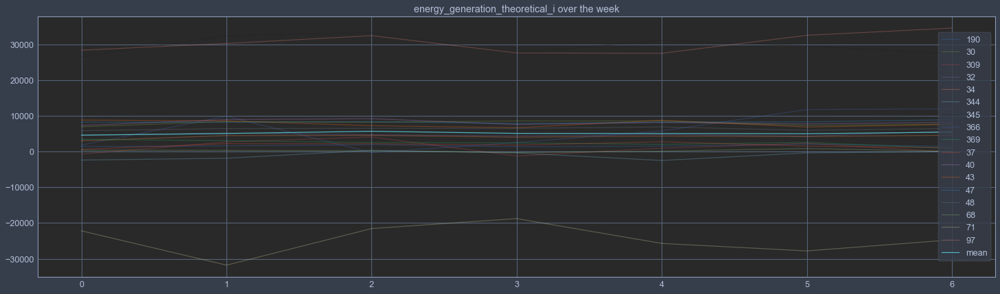

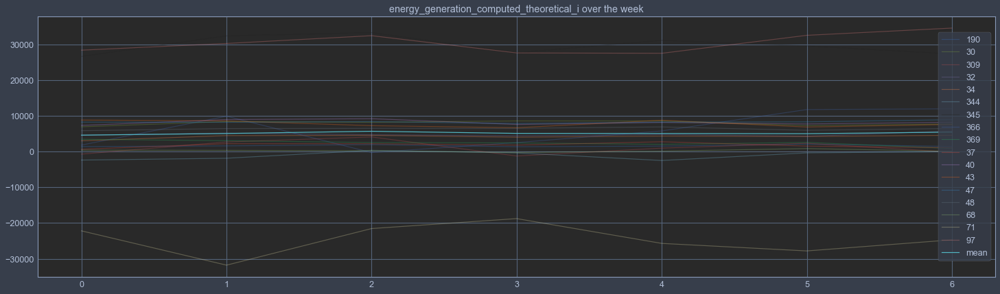

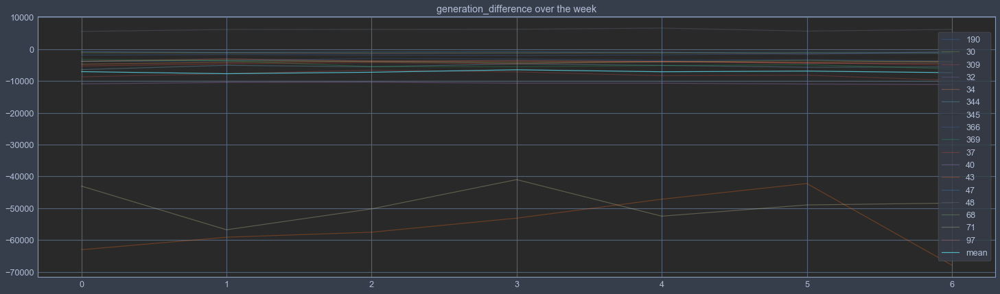

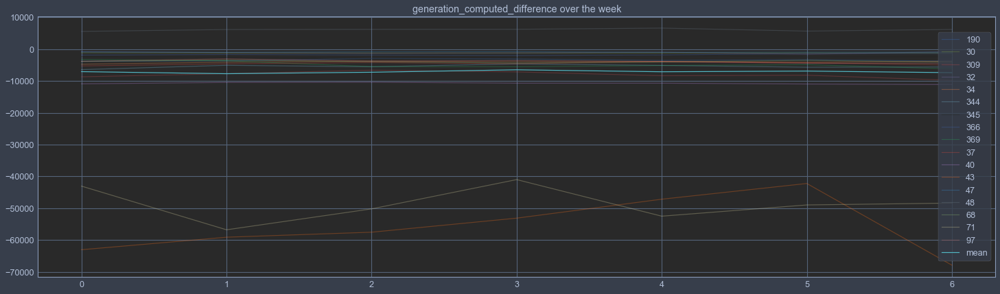

In [66]:
# Visualize voltages over the week
for var in variables:
    fig, ax = plt.subplots(1, 1, figsize=(25, 7))
    for station in stations:
        plt.plot(data.loc[station].groupby('weekday')[var].mean(), label=station, alpha=0.3)
        
    plt.plot(data.groupby('weekday')[var].mean(), label='mean')
    plt.title('{} over the week'.format(var))
    ax.set_facecolor('#292929')
    plt.legend(loc='right')
    plt.show()

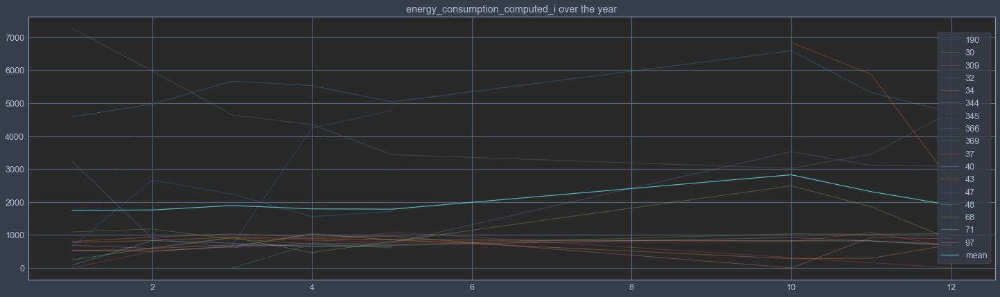

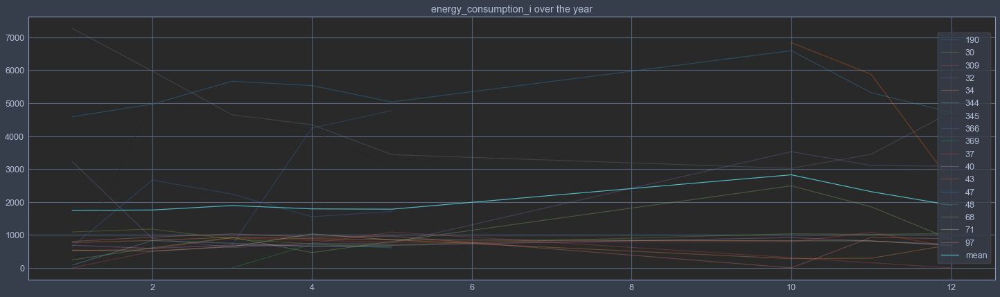

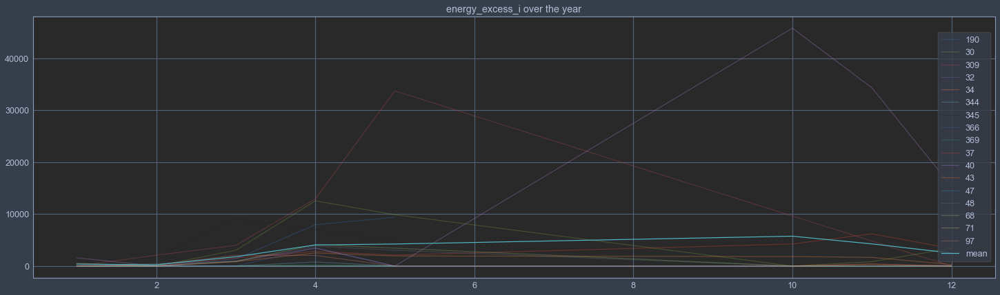

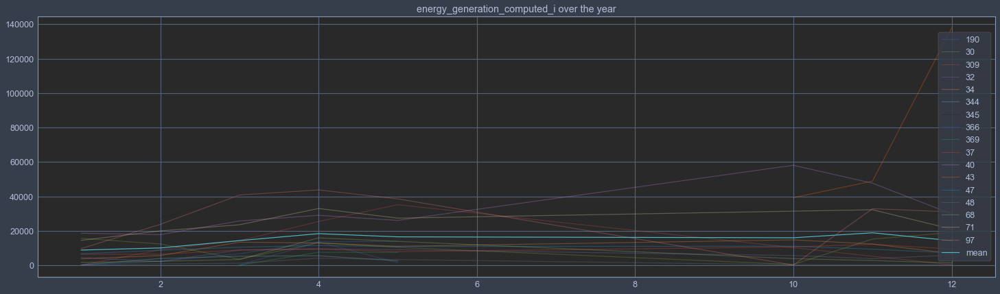

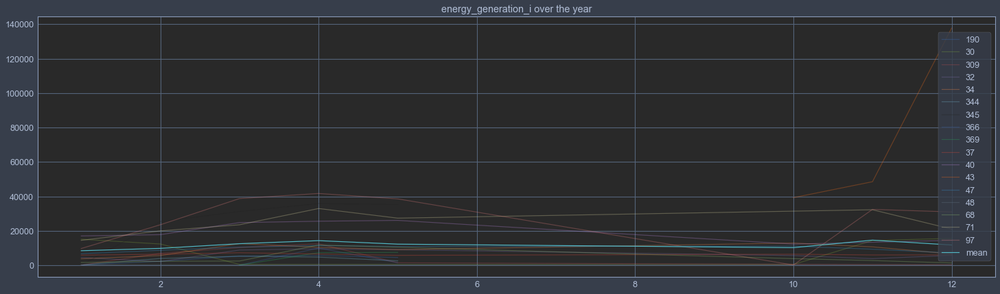

...

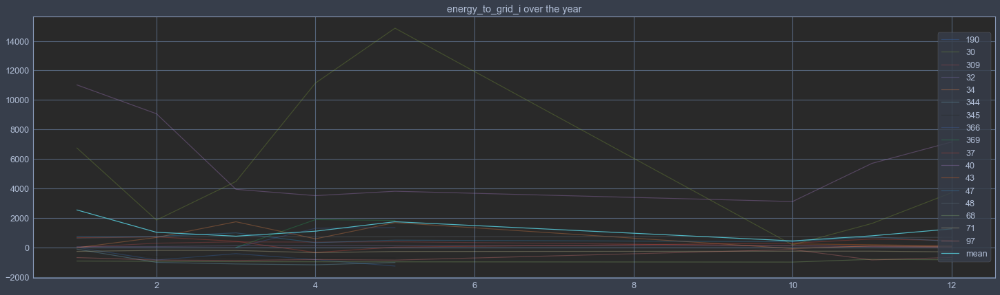

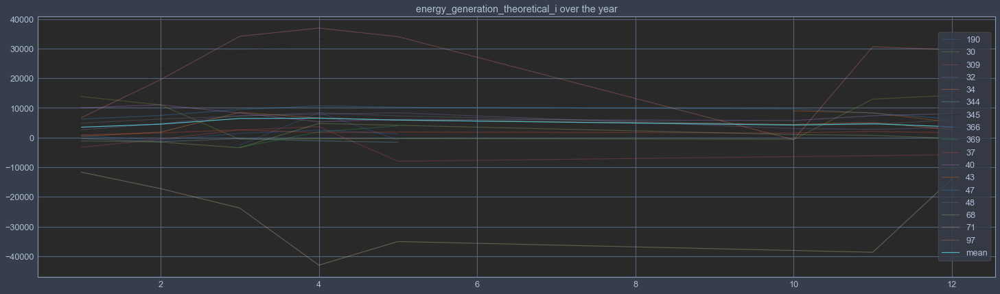

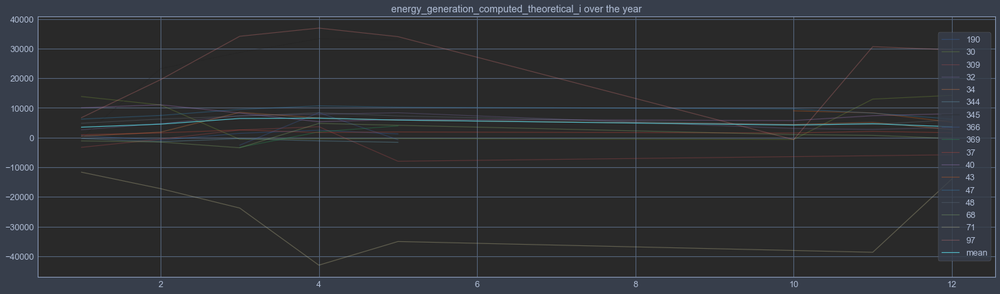

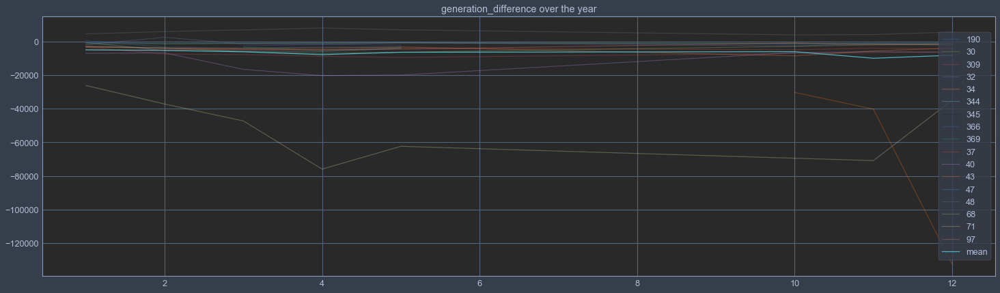

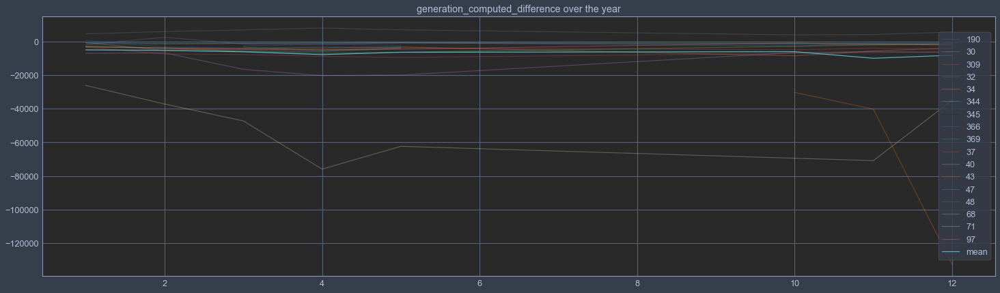

In [69]:
# Visualize voltages over the year
for var in variables:
    fig, ax = plt.subplots(1, 1, figsize=(25, 7))
    for station in stations:
        plt.plot(data.loc[station].groupby('month')[var].mean(), label=station, alpha=0.3)
        
    plt.plot(data.groupby('month')[var].mean(), label='mean')
    plt.title('{} over the year'.format(var))
    plt.legend(loc='right')
    ax.set_facecolor('#292929')
    plt.show()

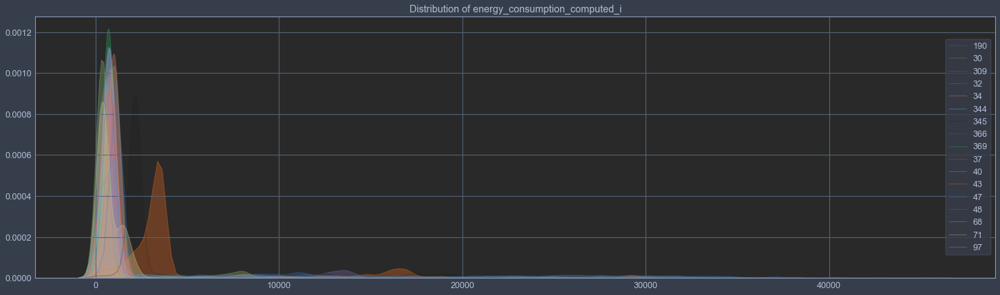

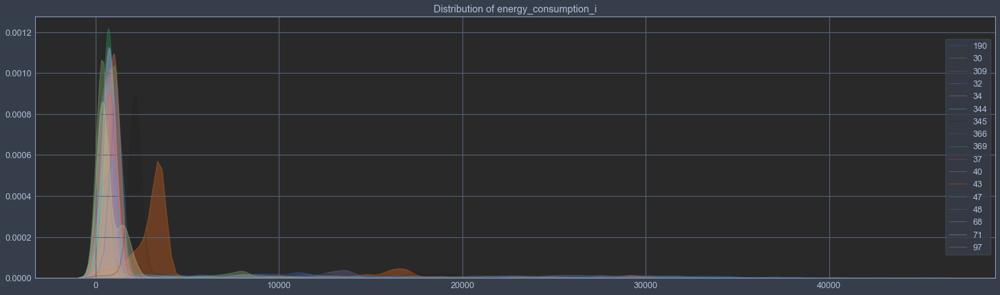

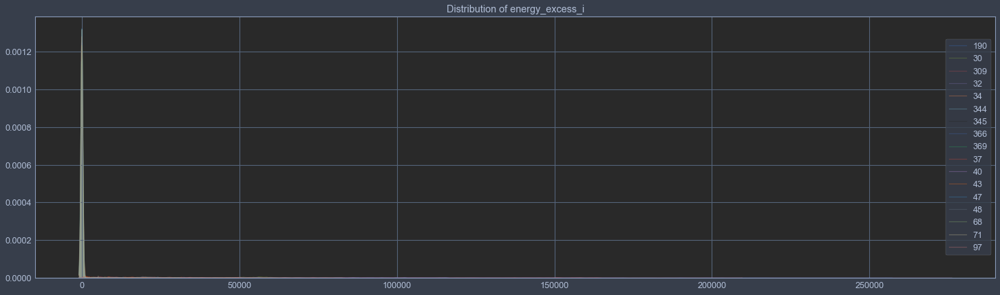

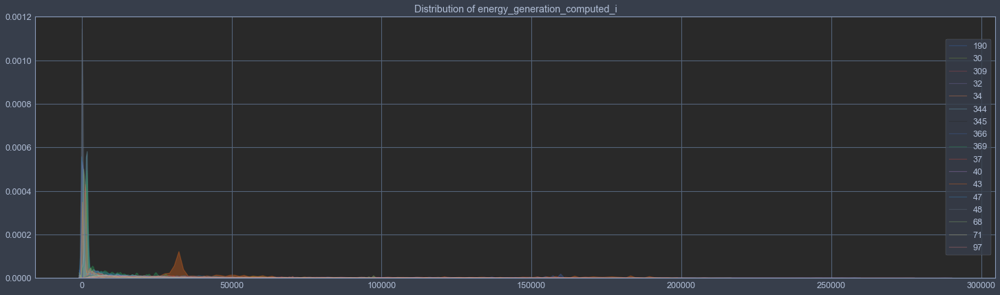

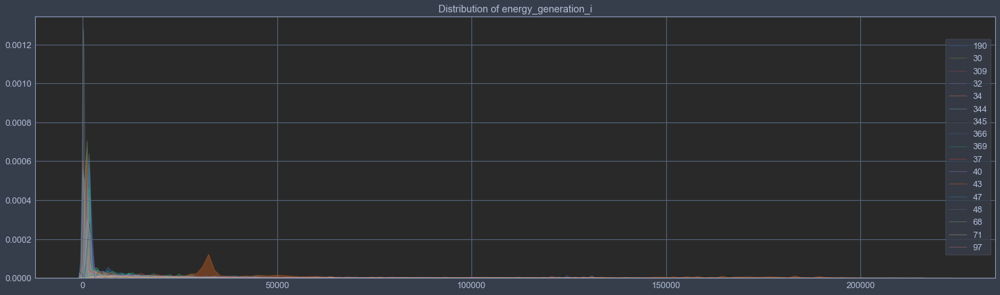

...

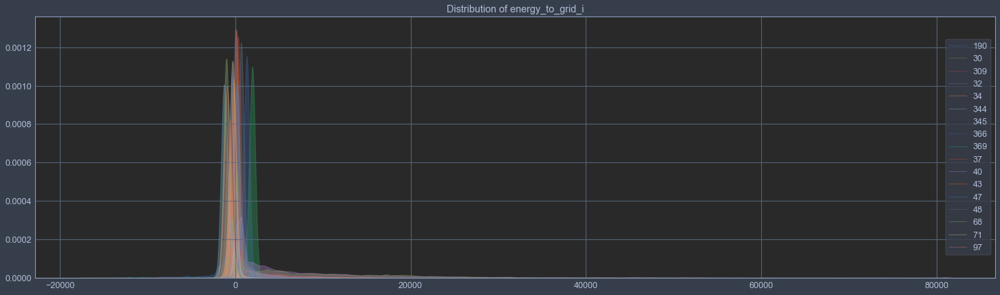

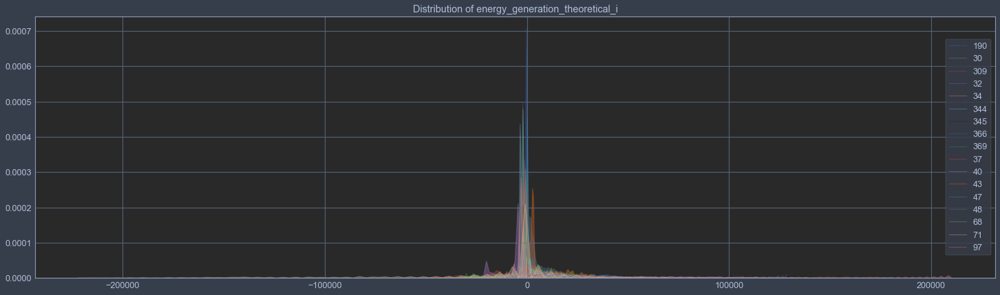

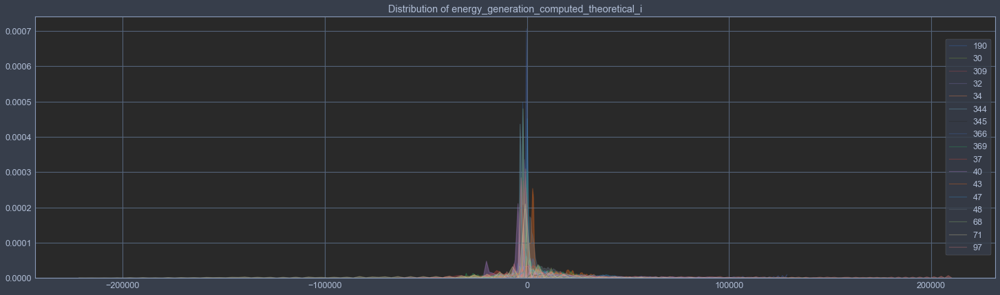

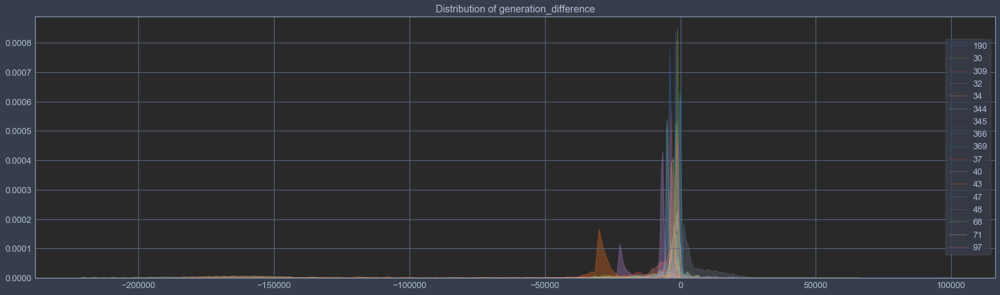

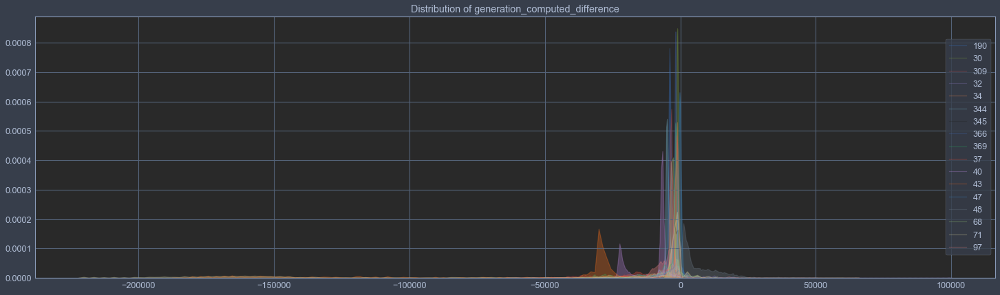

In [84]:
for var in variables:
    fig, ax = plt.subplots(1, 1, figsize=(25, 7))
    for station in stations:
        sns.kdeplot(data.loc[station, var].dropna().values, label=str(station), alpha=0.3, shade=True, bw=300)
        #plt.hist(data.loc[station, var].dropna().values, bins=50, label=str(station), alpha=0.7)
        
    plt.title('Distribution of {}'.format(var))
    plt.legend(loc='right')
    ax.set_facecolor('#292929')
    plt.show()

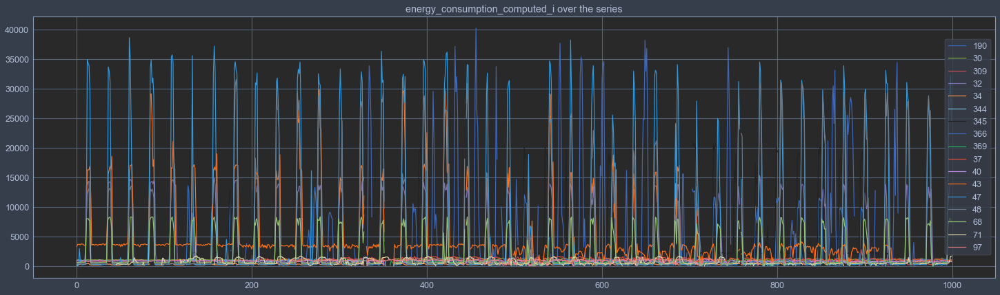

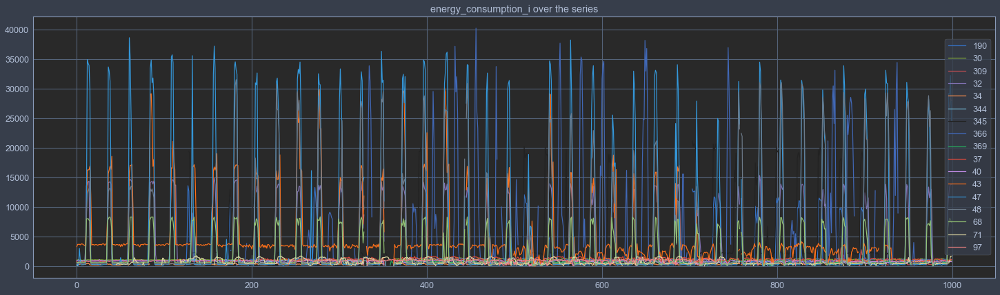

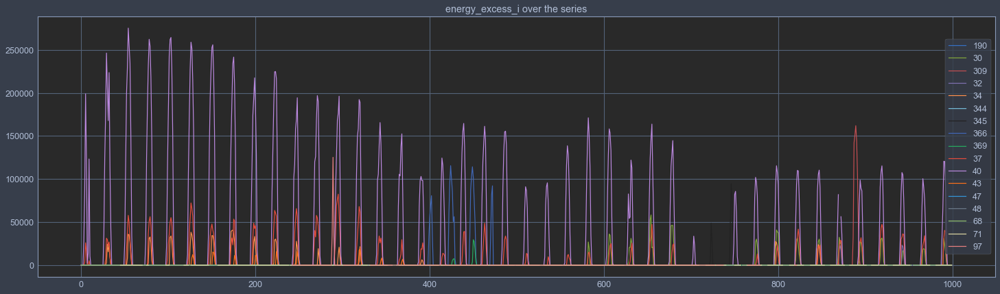

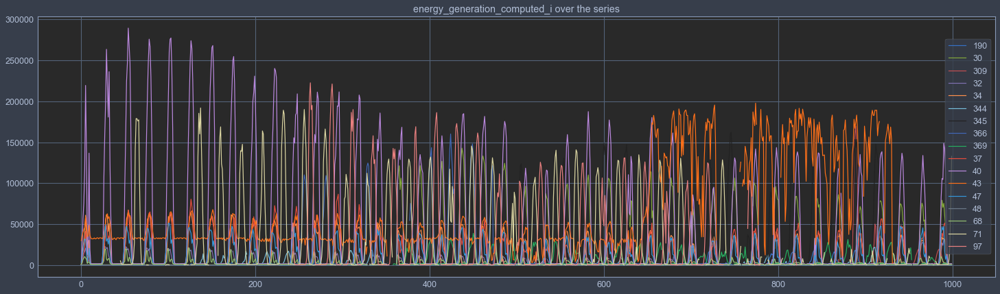

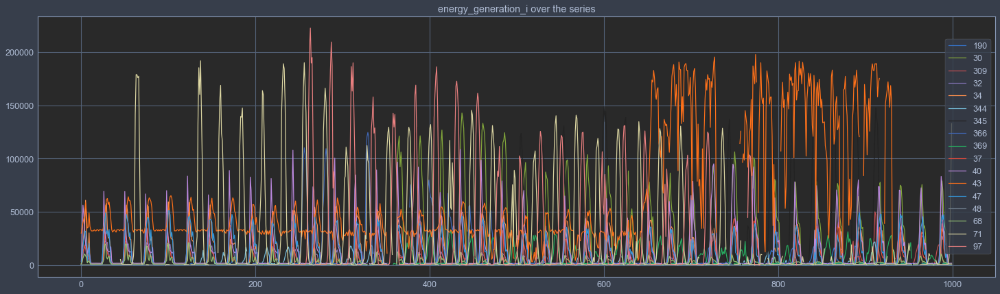

...

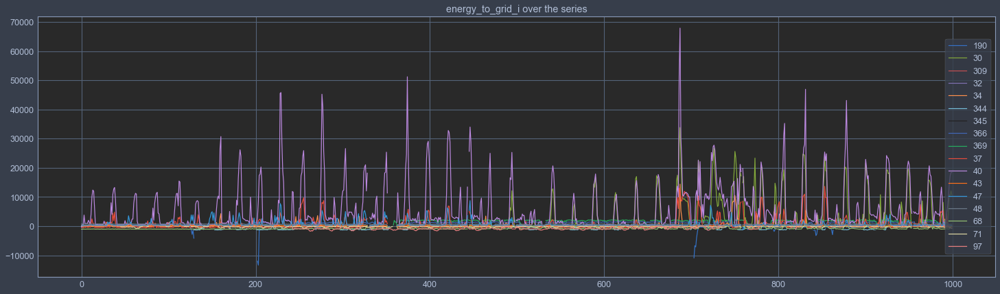

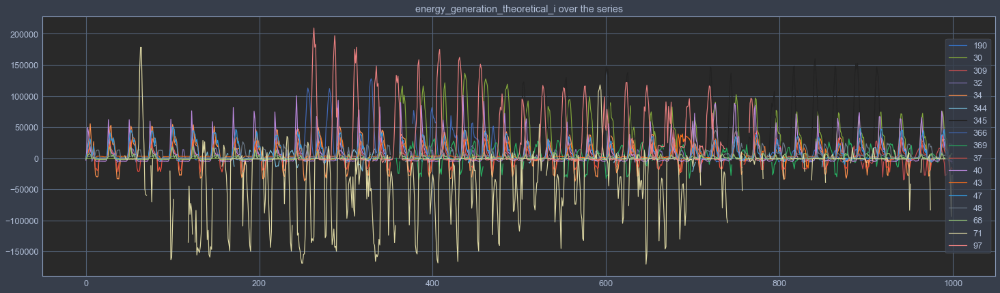

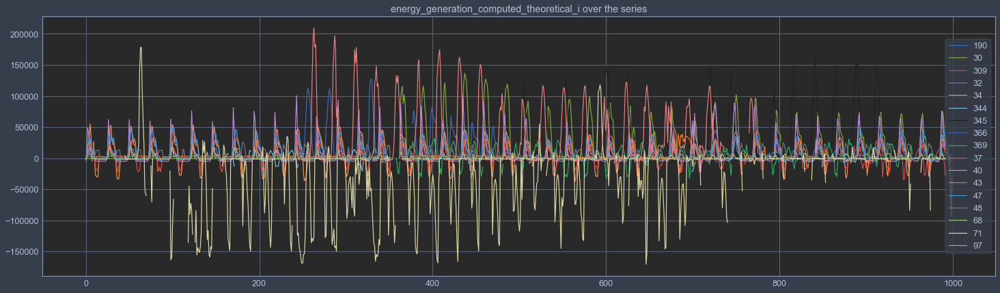

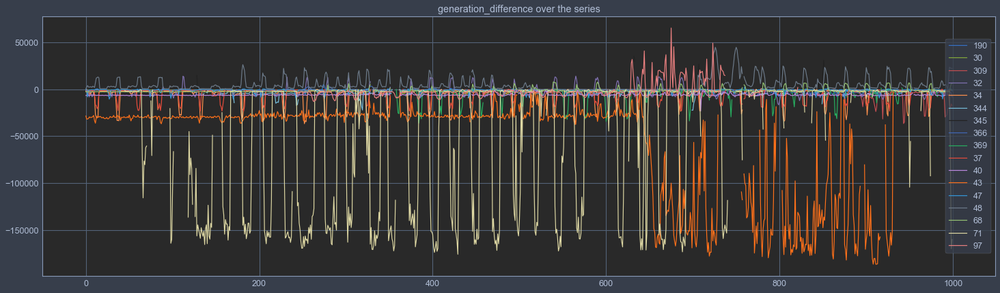

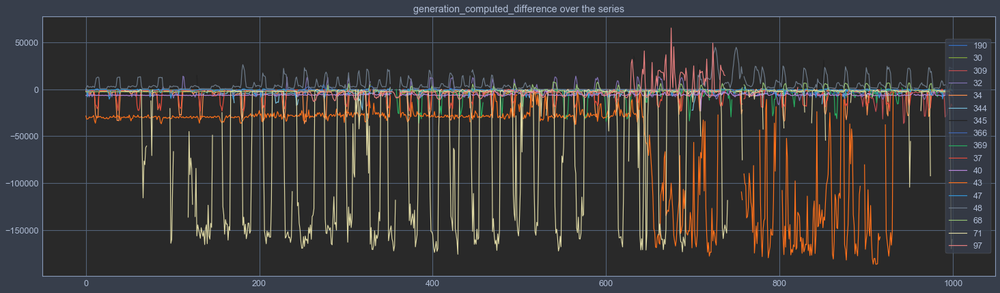

In [87]:
for var in variables:
    fig, ax = plt.subplots(1, 1, figsize=(25, 7))
    for station in stations:
        plt.plot(data.loc[station, var].iloc[:1000].values, label=station)
        
    plt.title('{} over the series'.format(var))
    plt.legend(loc='right')
    ax.set_facecolor('#292929')
    plt.show()

## Inefficiencies

In [89]:
data['energy_excess_i'].groupby('solbox_id').sum()

solbox_id
190    6132602.34
30    15961603.38
309   13654397.92
32      124089.07
34     4023072.49
344     195633.17
345    9351881.54
366    1628412.92
369     102038.51
37    10744623.71
40    41667491.49
43      240599.75
47       14519.95
48     4082487.92
68     3460036.59
71        9029.57
97     2740429.86
Name: energy_excess_i, dtype: float64

In [90]:
#1. - How much energy doesn't get used because of the battery being full and nobody buying energy?
print(data['energy_excess_i'].groupby('solbox_id').sum() / data['energy_generation_i'].groupby('solbox_id').sum())
print(data['energy_excess_i'].groupby('solbox_id').sum().sum() / data['energy_generation_i'].groupby('solbox_id').sum().sum())

solbox_id
190   0.94
30    0.43
309   0.99
32    0.01
34    0.12
344   0.06
345   0.20
366   0.34
369   0.03
37    0.40
40    0.51
43    0.00
47    0.00
48    4.33
68    0.24
71    0.00
97    0.03
dtype: float64
0.20950793733345657


### Analyzing untracked energy going to the battery

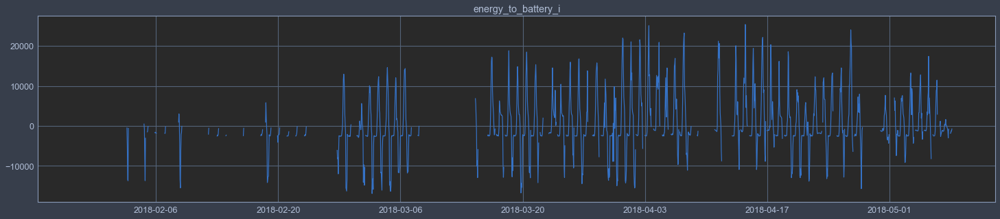

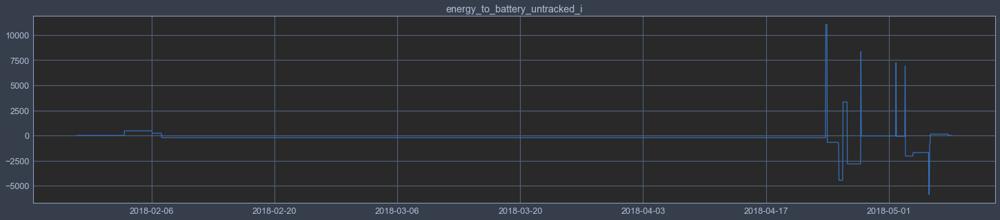

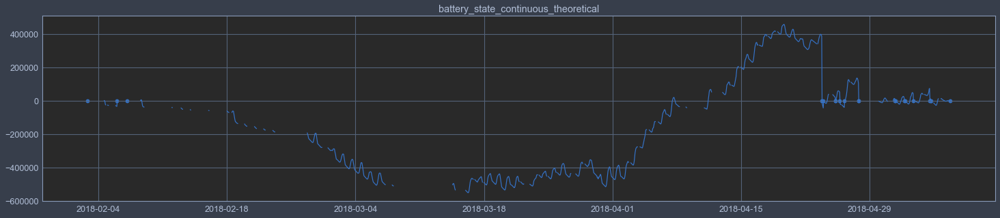

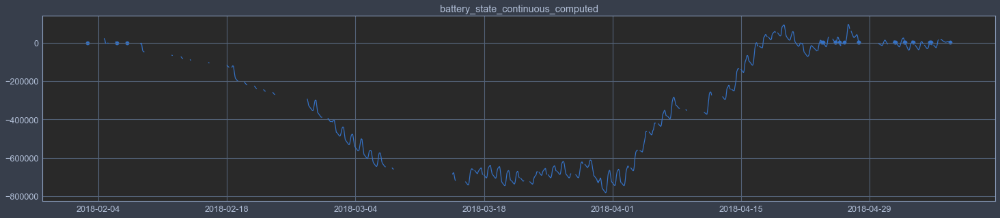

In [91]:
import random
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib

station = random.choice(range(3))
for var in ['energy_to_battery_i', 'energy_to_battery_untracked_i', 'battery_state_continuous_theoretical', 'battery_state_continuous_computed']:
    fig, ax = plt.subplots(1, 1, figsize=(25, 5))
    plt.plot(data.loc[data.reset_index()['solbox_id'].unique()[station]].reset_index().set_index('datetime')[var])
    if var in ['battery_state_continuous_theoretical', 'battery_state_continuous_computed']:
        _data = data.loc[data.reset_index()['solbox_id'].unique()[station]].reset_index()
        plt.scatter(_data['datetime'].values, _data['battery_state_continuous_at_change'].values)
    plt.title(var)
    ax.set_facecolor('#292929')
    plt.show()

In [93]:
print('Untracked energy to battery as a proportion of tracked energy to battery')
data['energy_to_battery_untracked_i'].abs().groupby('solbox_id').sum() / data['energy_to_battery_i'].abs().groupby('solbox_id').sum()

Untracked energy to battery as a proportion of tracked energy to battery


solbox_id
190   0.13
30    0.71
309   0.26
32    0.54
34    0.29
344   0.43
345   0.81
366   0.63
369   0.44
37    0.20
40    0.07
43    0.48
47    0.19
48    0.67
68    0.85
71    0.86
97    0.83
dtype: float64

### Analyze missingness patterns

In [94]:
data.isnull().groupby('solbox_id').mean()['hour']

solbox_id
190   0.46
30    0.11
309   0.53
32    0.09
34    0.07
344   0.68
345   0.40
366   0.40
369   0.47
37    0.06
40    0.06
43    0.14
47    0.14
48    0.20
68    0.21
71    0.32
97    0.47
Name: hour, dtype: float64

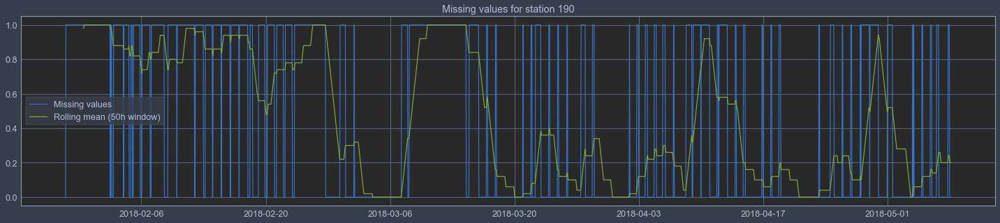

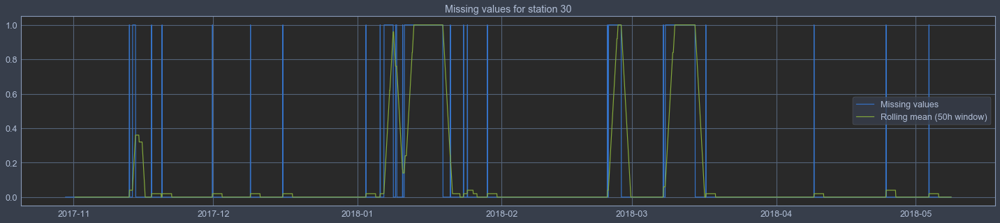

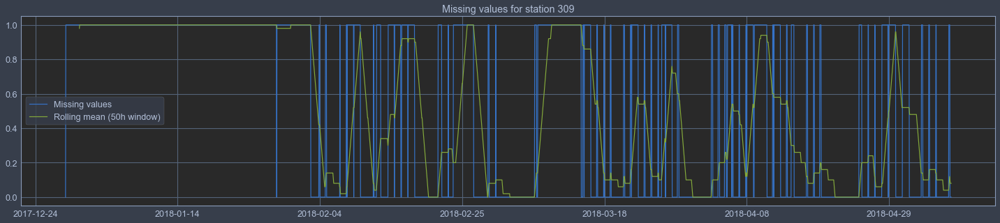

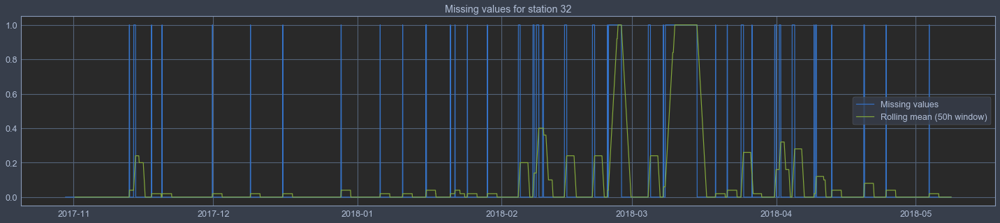

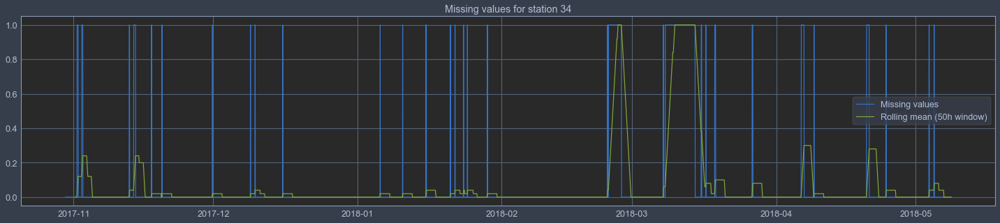

...

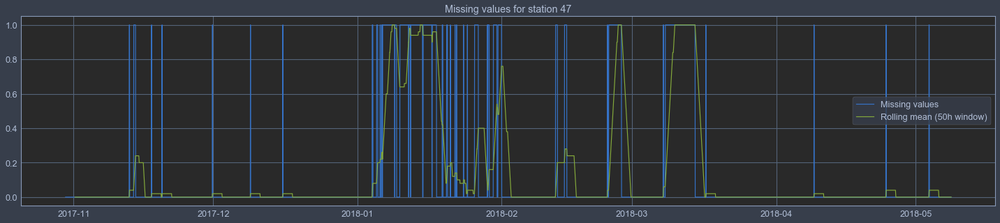

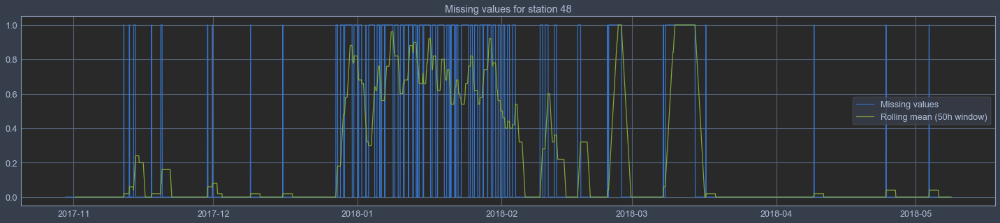

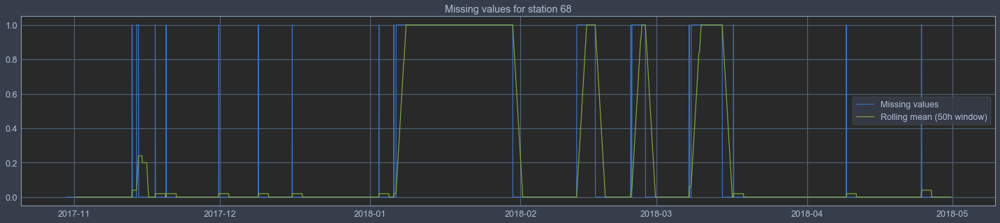

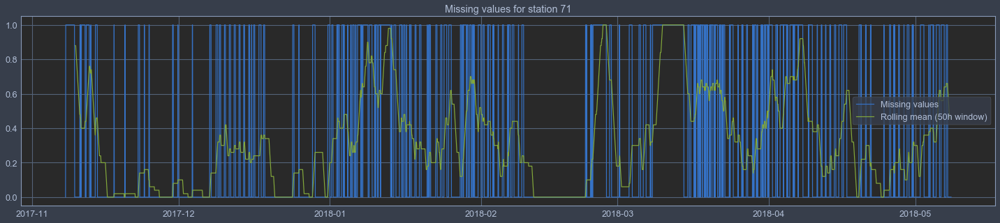

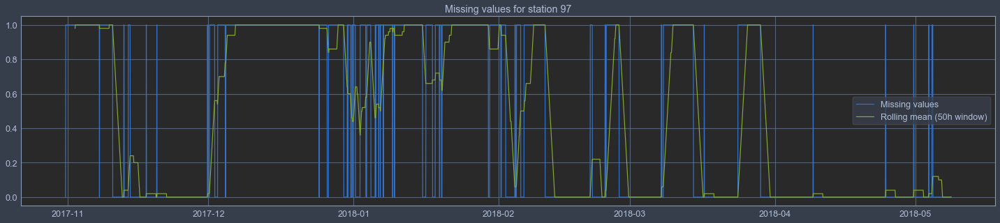

In [99]:
for station in stations:
    fig, ax = plt.subplots(1, 1, figsize=(25, 5))
    plt.plot(data.loc[station, 'energy_generation_i'].isnull(), label='Missing values')
    plt.plot(data.loc[station, 'energy_generation_i'].isnull().rolling(50).mean(), label='Rolling mean (50h window)')
    plt.title(f'Missing values for station {station}')
    plt.legend()
    ax.set_facecolor('#292929')
    plt.show()

In [100]:
from xgboost import XGBRegressor

def impute_missing_one_station(data):
    lags = 24
    model = XGBRegressor()
    for i in range(1, lags+1):
        data[f'energy_generation_i_lag_{i}'] = data[f'energy_generation_i'].shift(i)

    features = [f'energy_generation_i_lag_{i}' for i in range(1, lags+1)]
    model.fit(data.dropna(subset=['energy_generation_i'])[features], data['energy_generation_i'].dropna())
    predictions = pd.DataFrame({
        'predictions': model.predict(data.loc[data['energy_generation_i'].isnull(), features])
    }, index=data.loc[data['energy_generation_i'].isnull()].index)
    return predictions

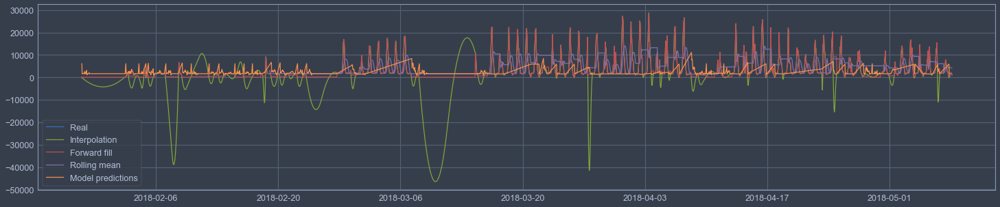

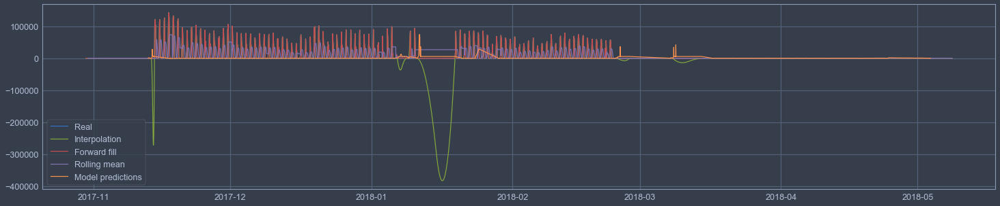

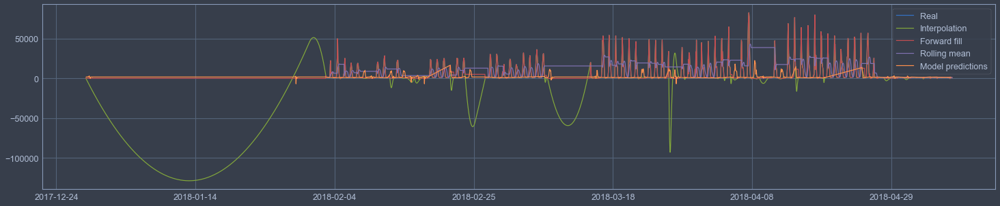

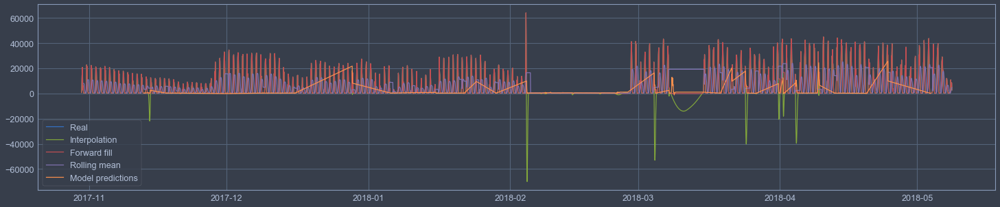

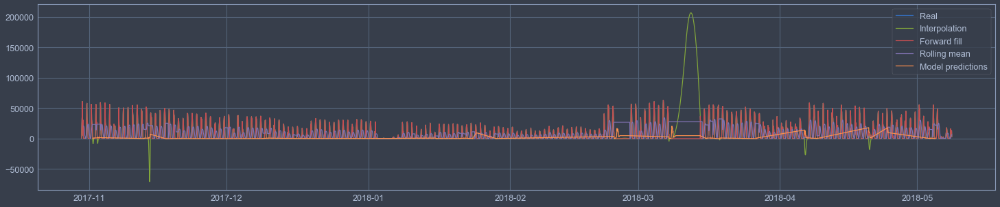

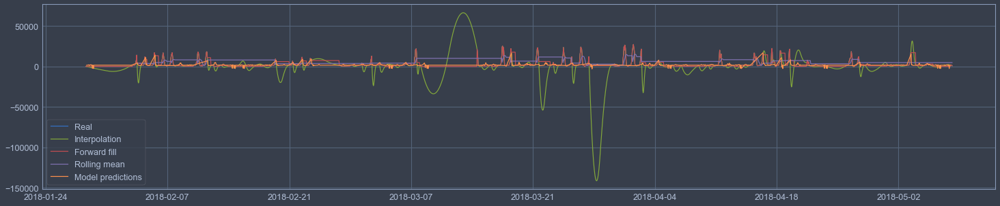

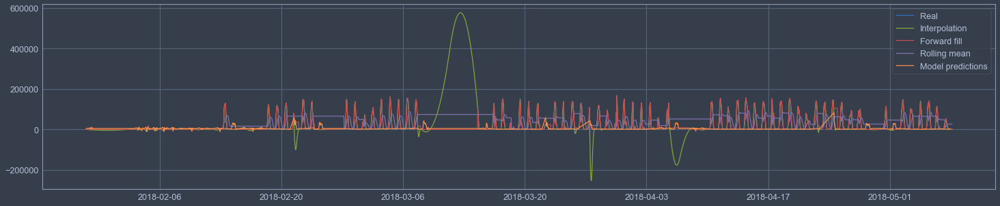

In [ ]:
for station in stations:
    plt.figure(figsize=(25, 5))
    plt.plot(data.loc[station, 'energy_generation_i'], label='Real')
    plt.plot(data.loc[station, 'energy_generation_i'].interpolate(method='spline', order=2), label='Interpolation')
    plt.plot(data.loc[station, 'energy_generation_i'].ffill(), label='Forward fill')
    plt.plot(data.loc[station, 'energy_generation_i'].rolling(12).mean().ffill(), label='Rolling mean')
    predictions = impute_missing_one_station(data.loc[station])
    plt.plot(predictions, label='Model predictions')
    plt.legend()
    plt.show()